<a href="https://colab.research.google.com/github/mjgpinheiro/Physics_models/blob/main/Acoustic_Wave_Mobius_rot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

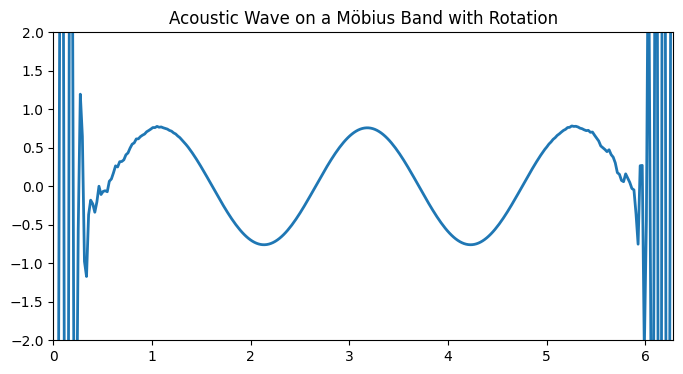

In [ ]:
# Topological Acoustic Rotor — Möbius Acoustic Wave Simulation
# Fully functional animation (JSHTML) for Google Colab / Jupyter

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

#--------------------------------------------
# Parameters
#--------------------------------------------
N = 300              # points along s
L = 2*np.pi          # length parameter
ds = L / N

c = 1.0              # acoustic speed (normalized)
omega = 1.2          # rotation speed
kappa = 0.4          # ergontropic coupling

# time step stability
dt = 0.2 * ds / c

#--------------------------------------------
# Arrays
#--------------------------------------------
s = np.linspace(0, L, N)

# initial wave (mode 3)
p   = np.sin(3*s)
p_t = np.zeros(N)

# angular momentum gradient
L_s = np.sin(2*s)
dL_ds = np.gradient(L_s, ds)


#--------------------------------------------
# Möbius boundary indexing (half-twist)
# p(s+2π, u) = p(s, -u)
def mobius_idx(i):
    # wrap index
    if i < 0:
        i = N + i
    if i >= N:
        i = i - N
    return N - 1 - i   # Möbius twist: index reversal


#--------------------------------------------
# Animation setup
#--------------------------------------------
fig, ax = plt.subplots(figsize=(8,4))
line, = ax.plot([], [], lw=2)
ax.set_ylim(-2, 2)
ax.set_xlim(0, L)
ax.set_title("Acoustic Wave on a Möbius Band with Rotation")

def init():
    line.set_data([], [])
    return line,


#--------------------------------------------
# Update step
#--------------------------------------------
def update(frame):
    global p, p_t

    # Laplacian using Möbius boundary
    lap = np.zeros(N)
    for i in range(N):
        lap[i] = (p[mobius_idx(i+1)] - 2*p[i] + p[mobius_idx(i-1)]) / ds**2

    # ergontrópico term
    erg = dL_ds * np.gradient(p, ds)

    # final PDE:
    # p_tt = c^2 lap + kappa erg - omega * d(p_t)/ds
    p_tt = c**2 * lap + kappa * erg - omega * np.gradient(p_t, ds)

    # integration (leapfrog)
    p_t = p_t + dt * p_tt
    p   = p   + dt * p_t

    line.set_data(s, p)
    return line,


#--------------------------------------------
# Run animation
#--------------------------------------------
ani = animation.FuncAnimation(
    fig, update, init_func=init,
    frames=300, interval=30, blit=True
)

# Display animation in Notebook
HTML(ani.to_jshtml())
